In [1]:
import os
os.sys.path.append("C:\\Users\mplitt\MightyMorphingPhotonRangers")
import utilities as u
import single_session_plots as ssp
import numpy as np
import scipy as sp
import sklearn as sk
from matplotlib import pyplot as plt
from LatentVarFuncs import *
import pickle
import scipy as sp
%matplotlib inline

%load_ext autoreload
%autoreload 2

C:\Users\mplitt\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# import behavioral sessions
mouse = '4139190.1'
df = u.load_session_db()
#ca1mice = ['4139190.1','4139190.3', '4054011.1','4139202.2']
#dgmice = ['4054010.4','4054010.5']


df = df[df['RewardCount']>10]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime'])

df_mouse = df[df['MouseName'].str.match(mouse)]
df_mouse = df_mouse[df_mouse['Track'].str.match('TwoTower_Timeout')]
df_mouse = df_mouse.sort_values(['DateTime'])

# pick candidate session
sess = df_mouse.iloc[4]

# get behavior and imaging data
behav = u.behavior_dataframe(sess['data file'],sess['scanmat'],concat=False)
d = u.by_trial_info(behav)
#tmp = ssp.run_behavior(behav,ratio = True)

#info = u.loadmat_sbx(sess['scanmat'])['info']
#ca_dat = u.load_ca_mat(sess['scanfile'])

#C = ca_dat['C_keep'][info['frame'][0]:info['frame'][-1]+1]

#frame_diff = behav.shape[0]-C.shape[0]
#if frame_diff>0:
#    behav = behav.iloc[:-frame_diff]
    
    
#C_z = sp.stats.zscore(C,axis=0)



G:\My Drive\2P_Data\TwoTower\4139190.1\24_06_2018\TwoTower_Timeout\TwoTower_Timeout_2_000.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:276: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:479: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


In [3]:
# load likelihoods for each set of parameters
alpha = np.linspace(.5,1,5)
beta = np.linspace(.5,1,5)



for i,a in enumerate(alpha.tolist()):
    for j,b in enumerate(beta.tolist()):
        # save results
        print(i,j)
        fname = "G:\\My Drive\\MCN\\project\\ParamSweep\\LL_alpha%f_beta%f.p" % (a,b)
        #LL = pickle.load(open(fname,'rb'))
       
        with open(fname,'rb') as f:
            #print(f)
            LL = pickle.load(f)
        
        
        
        for k,cell in enumerate(LL.keys()):
            if i==0 and j==0 and k == 0:
                ML_params = np.zeros([5,5,len(LL[cell]),len(LL.keys())])
            else:
                ML_params[i,j,:,k] = LL[cell]
            

# matrix of results should be (alpha x beta x trial x  cell)
    

0 0
0 1
0 2
0 3
0 4
1 0
1 1
1 2
1 3
1 4
2 0
2 1
2 2
2 3
2 4
3 0
3 1
3 2
3 3
3 4
4 0
4 1
4 2
4 3
4 4


In [4]:
print(ML_params.shape)


(5, 5, 114, 684)


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


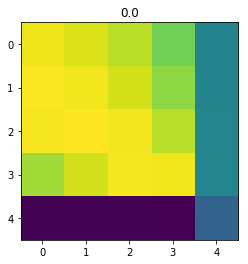

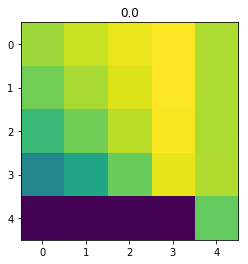

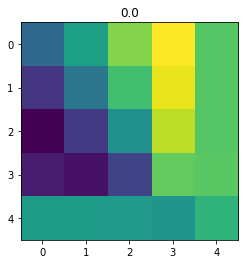

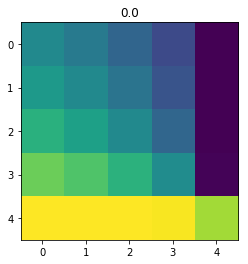

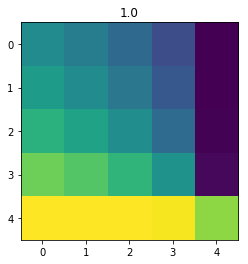

...

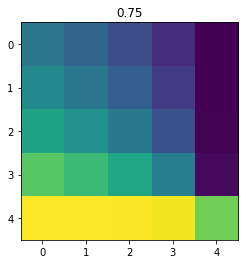

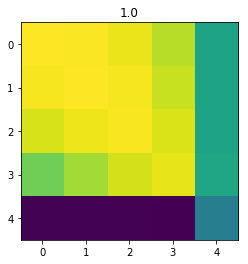

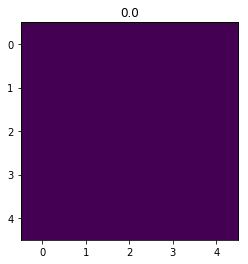

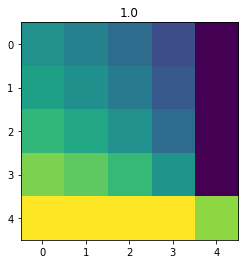

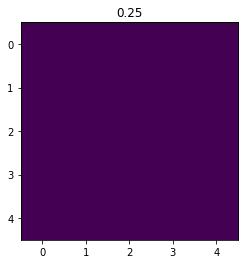

In [5]:
# for each cell
cell = 100
for trial in range(ML_params.shape[2]):
    if d['rewards'][trial]>0:
        f,ax = plt.subplots()
        ax.imshow(np.squeeze(ML_params[:,:,trial,cell])) #,vmin=-500,vmax=0)
        #print(ML_params[:,:,cell,trial])
        ax.set_title(d['morphs'][trial])
    # scatter plot of best alpha, beta across trials
    # add small noise to alpha, beta to see each dot, color by context

In [4]:
alpha_hat = np.zeros([ML_params.shape[2],ML_params.shape[3]])
beta_hat = np.zeros([ML_params.shape[2],ML_params.shape[3]])
for trial in range(ML_params.shape[2]):
    for cell in range(ML_params.shape[3]):
        a_ind,b_ind = np.unravel_index(np.argmax(ML_params[:,:,trial,cell]),[5,5])
        alpha_hat[trial,cell] = alpha[a_ind]
        beta_hat[trial,cell] = beta[b_ind]
    #for each cell
        #
        # find alpha and beta that maximize log-likelihood
        # save in (2 x trial x cell) matrix
        
    # plot scatter plot of best alpha and beta 
        # add small displacement to alpha and beta so that you can see the points
        


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


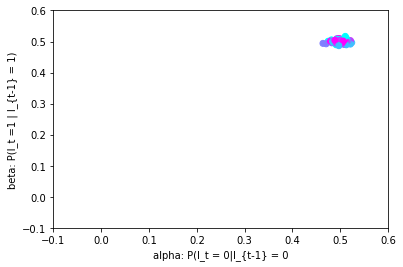

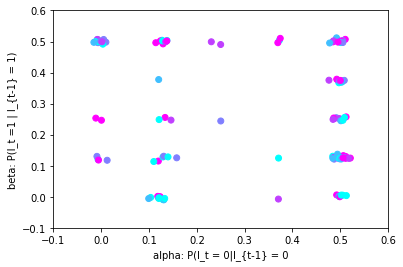

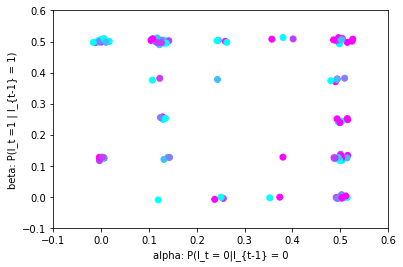

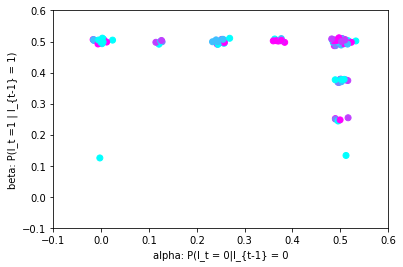

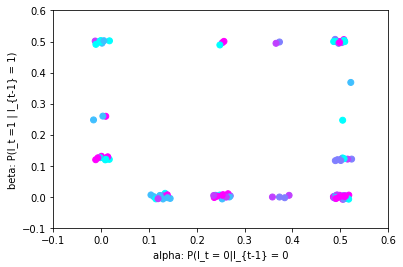

...

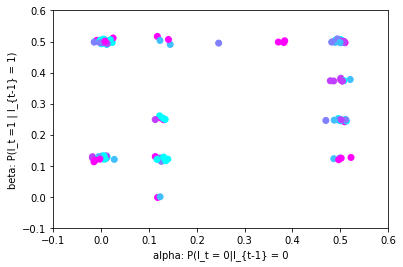

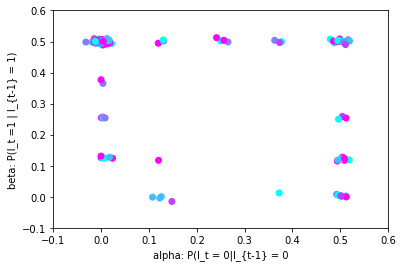

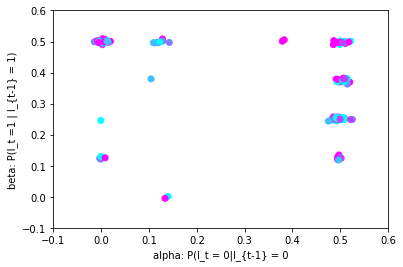

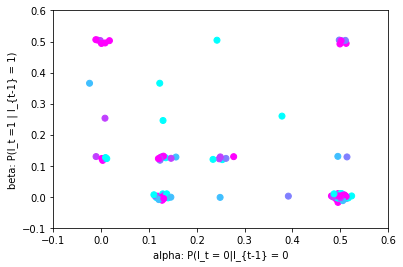

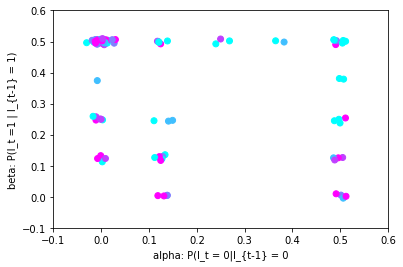

In [7]:

for cell in range(ML_params.shape[3]):
    #plt.hist(beta_hat[:,1])
    f,ax = plt.subplots()
    ax.scatter(1-alpha_hat[:,cell]+np.random.normal(0,.01,[ML_params.shape[2],]),1-beta_hat[:,cell]+np.random.normal(0,.005,[ML_params.shape[2],]),s=None,c=d['morphs'],cmap='cool')
    ax.set_xlim([-.1,.6])
    ax.set_ylim([-.1,.6])
    ax.set_xlabel('alpha: P(I_t = 0|I_{t-1} = 0')
    ax.set_ylabel('beta: P(I_t =1 | I_{t-1} = 1)')


In [17]:
keepCells = [40, 50, 60, 70, 160, 200, 230, 240,270, 310, 390, 420, 430, 600, 640, 650]

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


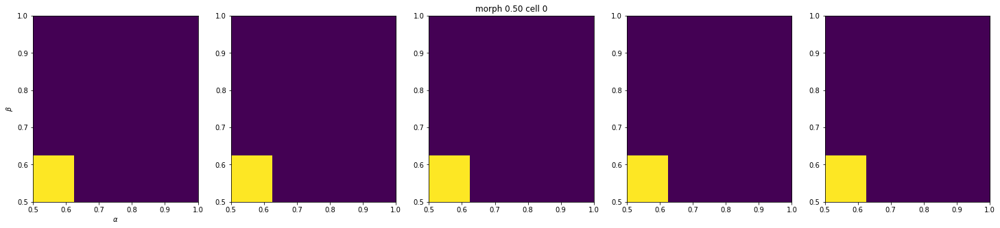

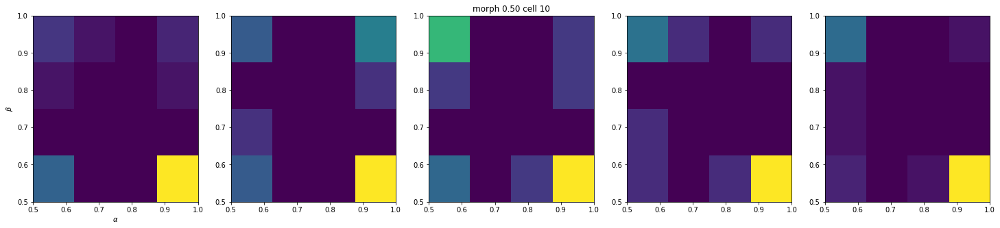

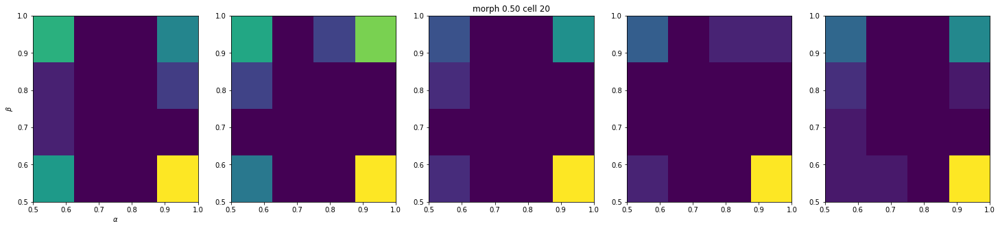

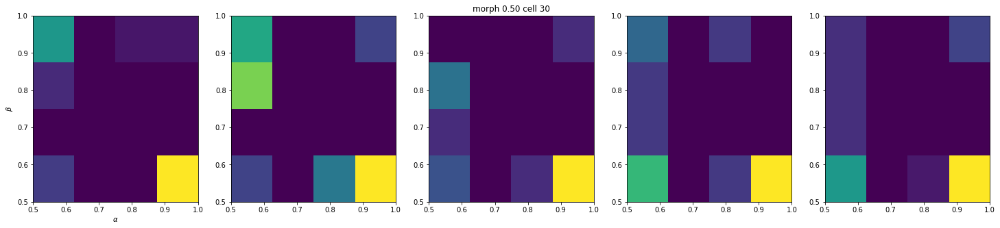

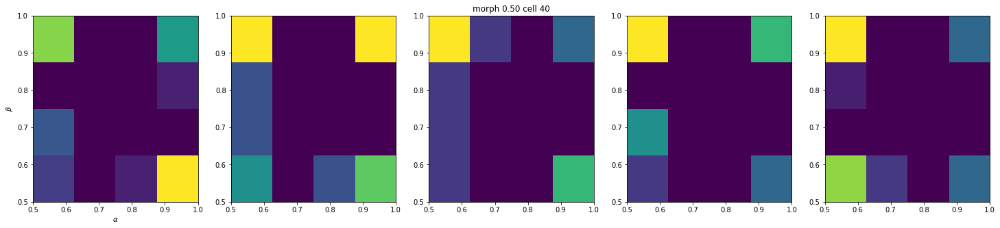

...

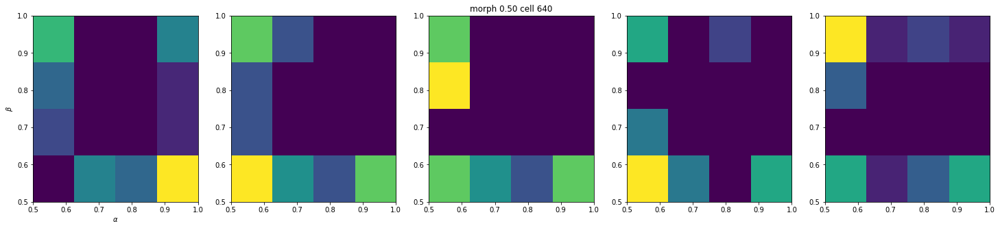

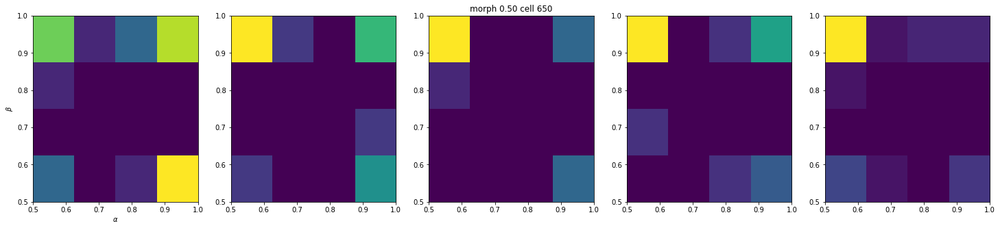

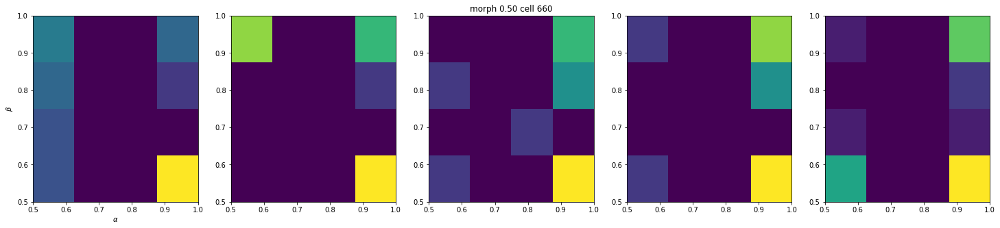

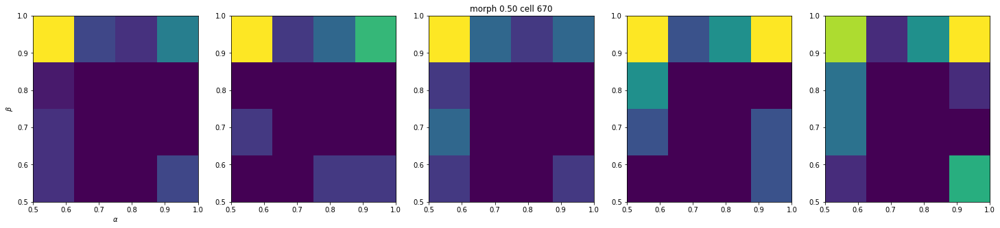

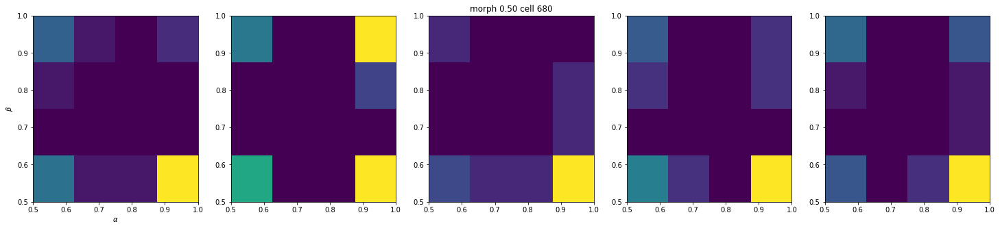

In [19]:
for cell in range(alpha_hat.shape[1]):
    if cell%10 == 0:
        f,ax = plt.subplots(1,5,figsize=[25,5])
        for i,m in enumerate([0, .25, .5, .75, 1]):
            tmask = d['morphs']==m
            
            #ax.hist(alpha_hat[tmask,:].ravel(),bins=5,alpha=.3)
            #ax.hist(beta_hat[tmask,:].ravel(),bins=5,alpha=.3)
            ax[i].hist2d(alpha_hat[tmask,cell].ravel(),beta_hat[tmask,cell].ravel(),bins=[alpha,beta])
            ax[i].set_xlim([.5,1])
            ax[i].set_ylim([.5,1])
            if i == 2:
                ax[i].set_title('morph %.2f cell %d' % (m,cell))
                ax[0].set_ylabel(r'$\beta$')
                ax[0].set_xlabel(r'$\alpha$')
        if cell in keepCells:
            f.savefig("G:\\My Drive\\MCN\\project\\AlphaBetaPlots\\%d.pdf" % cell)